In [44]:
%matplotlib inline

import os
import shutil
import random
import torch
import torchvision
import numpy as np


from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(0)

print('Using PyTorch version', torch.__version__)

Using PyTorch version 1.3.0+cpu


In [45]:
class_names = ['normal', 'adenocarcinoma', 'squamouscellcarcinoma']
root_dir = 'Data'
source_dirs = ['normal', 'adenocarcinoma ', 'squamouscellcarcinoma ']

if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    for c in class_names: 
        images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('png')]
        selected_images = random.sample(images, 30)
        for image in selected_images:
            source_path = os.path.join(root_dir, c, image)
            target_path = os.path.join(root_dir, 'test', c, image)
            shutil.move(source_path, target_path)

In [46]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x[-3:].lower().endswith('png')]
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names = ['normal', 'adenocarcinoma', 'squamouscellcarcinoma']
        
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)
            
        self.image_dirs = image_dirs
        self.transform = transform
        
    
    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])
    
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

In [47]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [48]:
train_dirs = {
    'normal': 'Data/normal',
    'adenocarcinoma': 'Data/adenocarcinoma',
    'squamouscellcarcinoma': 'Data/squamouscellcarcinoma'
}

train_dataset = ChestXRayDataset(train_dirs, train_transform)

Found 132 normal examples
Found 195 adenocarcinoma examples
Found 155 squamouscellcarcinoma examples


In [49]:
test_dirs = {
    'normal': 'Data/valid/normal',
    'adenocarcinoma': 'Data/valid/adenocarcinoma',
    'squamouscellcarcinoma': 'Data/valid/squamouscellcarcinoma'
}

test_dataset = ChestXRayDataset(test_dirs, test_transform)

Found 13 normal examples
Found 23 adenocarcinoma examples
Found 15 squamouscellcarcinoma examples


In [92]:
batch_size = 1

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 482
Number of test batches 51


In [93]:
class_names = train_dataset.class_names


def show_images(images, labels, preds):
    plt.figure(figsize=(15, 15))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

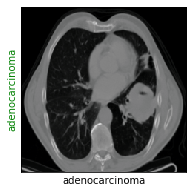

In [94]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

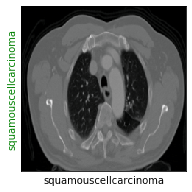

In [95]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

In [96]:
resnet18 = torchvision.models.resnet18(pretrained=True)

print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [97]:
resnet18.fc = torch.nn.Linear(in_features=512, out_features=3)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet18.parameters(), lr=3e-5)

In [98]:
def show_preds():
    resnet18.eval()
    images, labels = next(iter(dl_test))
    outputs = resnet18(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)
    print(preds)
    
    #print(images)

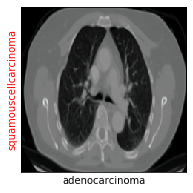

tensor([2])


In [99]:
show_preds()

In [59]:
def save_checkpoint(model, optimizer, save_path, epoch):
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch': epoch
    }, save_path)

In [5]:
def load_checkpoint(model, optimizer, load_path):
    checkpoint = torch.load(load_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    
    return model, optimizer, epoch

In [102]:
 model, optimizer, epoch = load_checkpoint(resnet18, optimizer, 'new3.model')

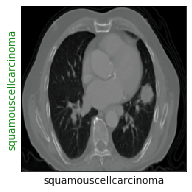

In [40]:
images, labels = next(iter(dl_test))
image = images[0].reshape(1, 3, 224, 224)
label = labels[0].reshape(1)

image.shape
output = model(image)
output
_, preds = torch.max(output, 1)

show_images(image, label, preds)

In [109]:
test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

image = Image.open("check/adenocarcinoma (33).png").convert('RGB')
im=test_transform(image).reshape(1, 3, 224, 224)
im.shape
output = model(im)
_, preds = torch.max(output, 1)
l=["normal",'adenocarcinoma','squamouscellcarcinoma']
Predictions=l[int(preds[0])]
print(Predictions)


adenocarcinoma


In [ ]:
print(int(preds[0]))

In [100]:
def train(epochs):
    print('Starting training..')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.
        

        resnet18.train() # set model to training phase

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = resnet18(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                resnet18.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(dl_test):
                    outputs = resnet18(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_preds()

                resnet18.train()

                if accuracy >= 0.95:
                    print('Performance condition satisfied, stopping..')
#                     torch.save(model.state_dict(),'best_checkpoint.model')
#                     torch.save(resnet18.state_dict(),'best_model.model')
                    save_checkpoint(resnet18, optimizer, 'new3.model', epochs)
                    return

        train_loss /= (train_step + 1)
        print('Accuracy:',accuracy)
        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Starting training..
Starting epoch 1/50
Evaluating at step 0
Validation Loss: 1.1426, Accuracy: 0.3137


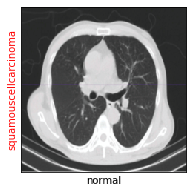

tensor([2])
Evaluating at step 20
Validation Loss: 1.0230, Accuracy: 0.5882


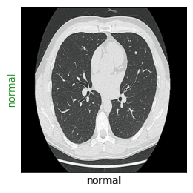

tensor([0])
Evaluating at step 40
Validation Loss: 1.0261, Accuracy: 0.4706


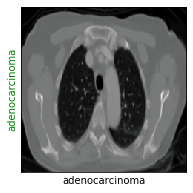

tensor([1])
Evaluating at step 60
Validation Loss: 1.0714, Accuracy: 0.4510


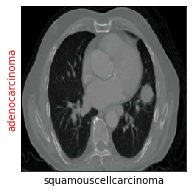

tensor([1])
Evaluating at step 80
Validation Loss: 1.1127, Accuracy: 0.2353


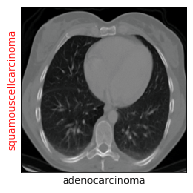

tensor([2])
Evaluating at step 100
Validation Loss: 1.1582, Accuracy: 0.3137


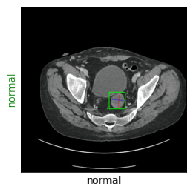

tensor([0])
Evaluating at step 120
Validation Loss: 1.1041, Accuracy: 0.3333


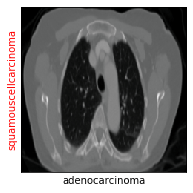

tensor([2])
Evaluating at step 140
Validation Loss: 1.0958, Accuracy: 0.4118


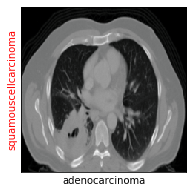

tensor([2])
Evaluating at step 160
Validation Loss: 1.0610, Accuracy: 0.3529


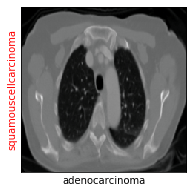

tensor([2])
Evaluating at step 180
Validation Loss: 1.0886, Accuracy: 0.3137


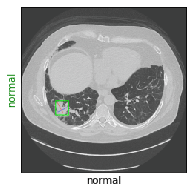

tensor([0])
Evaluating at step 200
Validation Loss: 1.1164, Accuracy: 0.3529


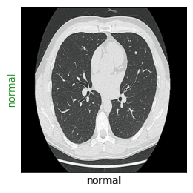

tensor([0])
Evaluating at step 220
Validation Loss: 1.1376, Accuracy: 0.3922


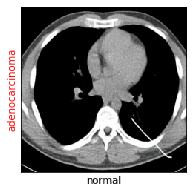

tensor([1])
Evaluating at step 240
Validation Loss: 1.0146, Accuracy: 0.4118


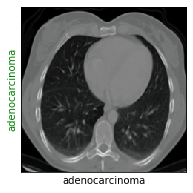

tensor([1])
Evaluating at step 260
Validation Loss: 1.0665, Accuracy: 0.5098


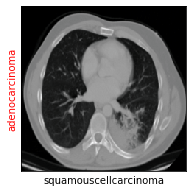

tensor([1])
Evaluating at step 280
Validation Loss: 1.1210, Accuracy: 0.4510


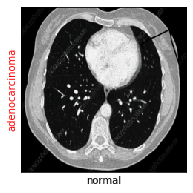

tensor([1])
Evaluating at step 300
Validation Loss: 1.0947, Accuracy: 0.3333


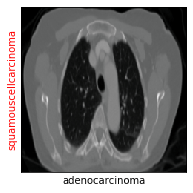

tensor([2])
Evaluating at step 320
Validation Loss: 1.1228, Accuracy: 0.4706


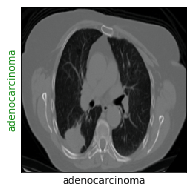

tensor([1])
Evaluating at step 340
Validation Loss: 1.0068, Accuracy: 0.4510


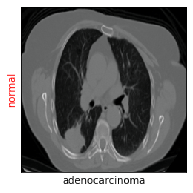

tensor([0])
Evaluating at step 360
Validation Loss: 1.0921, Accuracy: 0.4902


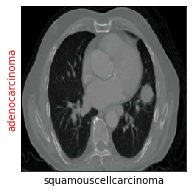

tensor([1])
Evaluating at step 380
Validation Loss: 1.1237, Accuracy: 0.3137


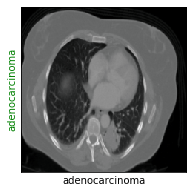

tensor([1])
Evaluating at step 400
Validation Loss: 1.0503, Accuracy: 0.3529


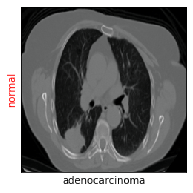

tensor([0])
Evaluating at step 420
Validation Loss: 1.0757, Accuracy: 0.4510


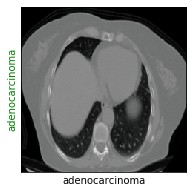

tensor([1])
Evaluating at step 440
Validation Loss: 1.0495, Accuracy: 0.4314


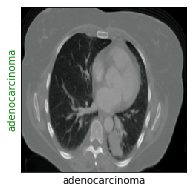

tensor([1])
Evaluating at step 460
Validation Loss: 1.0802, Accuracy: 0.4314


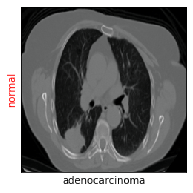

tensor([0])
Evaluating at step 480
Validation Loss: 1.1281, Accuracy: 0.3725


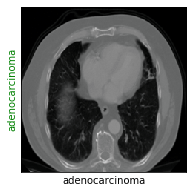

tensor([1])
Accuracy: 0.37254901960784315
Training Loss: 0.9286
Starting epoch 2/50
Evaluating at step 0
Validation Loss: 1.0878, Accuracy: 0.3137


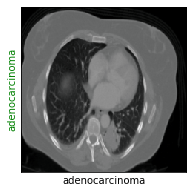

tensor([1])
Evaluating at step 20
Validation Loss: 1.0610, Accuracy: 0.4706


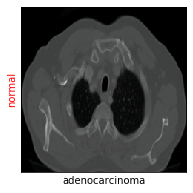

tensor([0])
Evaluating at step 40
Validation Loss: 1.0534, Accuracy: 0.5098


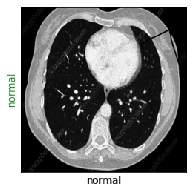

tensor([0])
Evaluating at step 60
Validation Loss: 1.1198, Accuracy: 0.3922


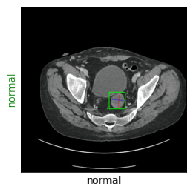

tensor([0])
Evaluating at step 80
Validation Loss: 1.0331, Accuracy: 0.5098


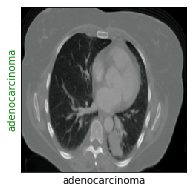

tensor([1])
Evaluating at step 100
Validation Loss: 1.1261, Accuracy: 0.3922


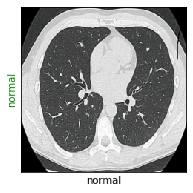

tensor([0])
Evaluating at step 120
Validation Loss: 1.1240, Accuracy: 0.3922


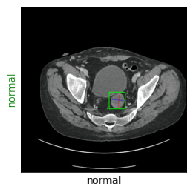

tensor([0])
Evaluating at step 140
Validation Loss: 1.0530, Accuracy: 0.4118


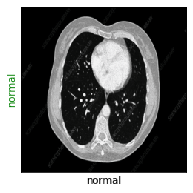

tensor([0])
Evaluating at step 160
Validation Loss: 1.0170, Accuracy: 0.4706


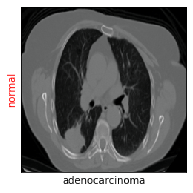

tensor([0])
Evaluating at step 180
Validation Loss: 1.0512, Accuracy: 0.4902


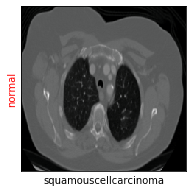

tensor([0])
Evaluating at step 200
Validation Loss: 1.0184, Accuracy: 0.4118


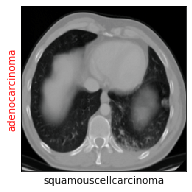

tensor([1])
Evaluating at step 220
Validation Loss: 1.0245, Accuracy: 0.5098


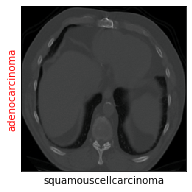

tensor([1])
Evaluating at step 240
Validation Loss: 1.0207, Accuracy: 0.4118


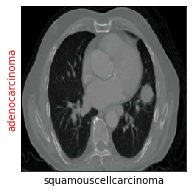

tensor([1])
Evaluating at step 260
Validation Loss: 1.0573, Accuracy: 0.4902


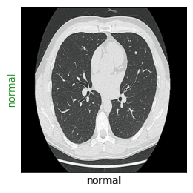

tensor([0])
Evaluating at step 280
Validation Loss: 1.0265, Accuracy: 0.4118


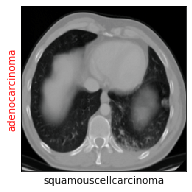

tensor([1])
Evaluating at step 300
Validation Loss: 0.9601, Accuracy: 0.5686


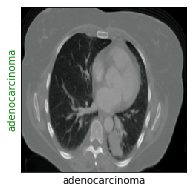

tensor([1])
Evaluating at step 320
Validation Loss: 0.9800, Accuracy: 0.5882


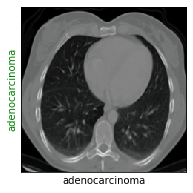

tensor([1])
Evaluating at step 340
Validation Loss: 1.0727, Accuracy: 0.2941


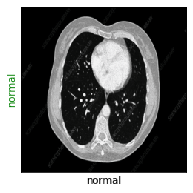

tensor([0])
Evaluating at step 360
Validation Loss: 1.0251, Accuracy: 0.4314


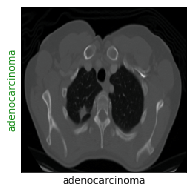

tensor([1])
Evaluating at step 380
Validation Loss: 1.0228, Accuracy: 0.4902


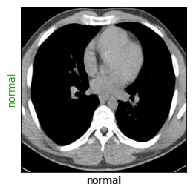

tensor([0])
Evaluating at step 400
Validation Loss: 1.0011, Accuracy: 0.6275


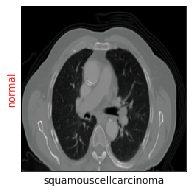

tensor([0])
Evaluating at step 420
Validation Loss: 0.9877, Accuracy: 0.5490


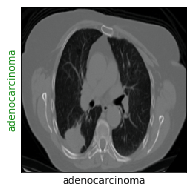

tensor([1])
Evaluating at step 440
Validation Loss: 1.0054, Accuracy: 0.5098


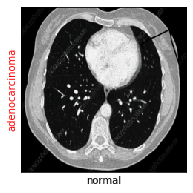

tensor([1])
Evaluating at step 460
Validation Loss: 1.0613, Accuracy: 0.4314


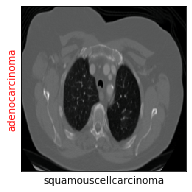

tensor([1])
Evaluating at step 480
Validation Loss: 0.9941, Accuracy: 0.5490


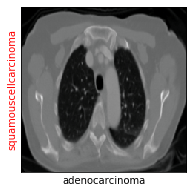

tensor([2])
Accuracy: 0.5490196078431373
Training Loss: 0.5898
Starting epoch 3/50
Evaluating at step 0
Validation Loss: 1.0119, Accuracy: 0.5490


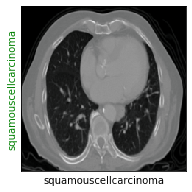

tensor([2])
Evaluating at step 20
Validation Loss: 1.0340, Accuracy: 0.5294


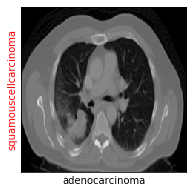

tensor([2])
Evaluating at step 40
Validation Loss: 1.0128, Accuracy: 0.4902


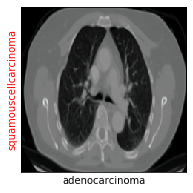

tensor([2])
Evaluating at step 60
Validation Loss: 0.9921, Accuracy: 0.6078


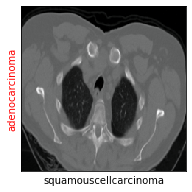

tensor([1])
Evaluating at step 80
Validation Loss: 0.9470, Accuracy: 0.6275


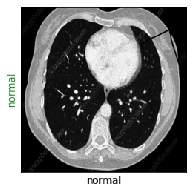

tensor([0])
Evaluating at step 100
Validation Loss: 1.0168, Accuracy: 0.4902


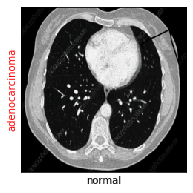

tensor([1])
Evaluating at step 120
Validation Loss: 0.9778, Accuracy: 0.5882


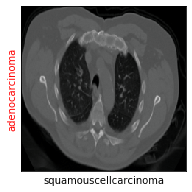

tensor([1])
Evaluating at step 140
Validation Loss: 1.0227, Accuracy: 0.4510


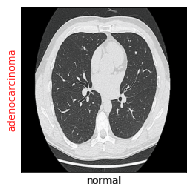

tensor([1])
Evaluating at step 160
Validation Loss: 1.0369, Accuracy: 0.4902


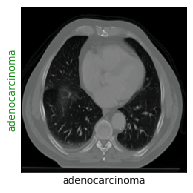

tensor([1])
Evaluating at step 180
Validation Loss: 0.9909, Accuracy: 0.5686


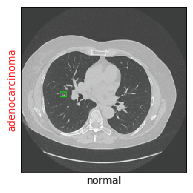

tensor([1])
Evaluating at step 200
Validation Loss: 1.0078, Accuracy: 0.5686


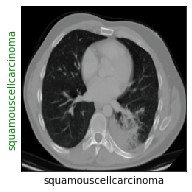

tensor([2])
Evaluating at step 220
Validation Loss: 0.9787, Accuracy: 0.5686


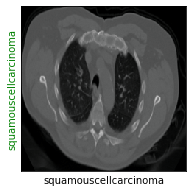

tensor([2])
Evaluating at step 240
Validation Loss: 0.9539, Accuracy: 0.6078


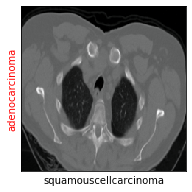

tensor([1])
Evaluating at step 260
Validation Loss: 0.9190, Accuracy: 0.6078


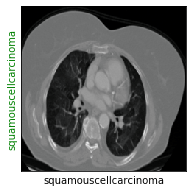

tensor([2])
Evaluating at step 280
Validation Loss: 0.9363, Accuracy: 0.4902


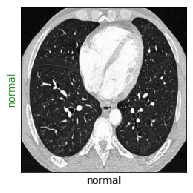

tensor([0])
Evaluating at step 300
Validation Loss: 0.9258, Accuracy: 0.7255


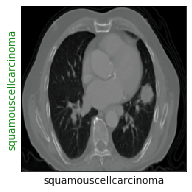

tensor([2])
Evaluating at step 320
Validation Loss: 0.9709, Accuracy: 0.5294


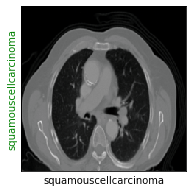

tensor([2])
Evaluating at step 340
Validation Loss: 0.9462, Accuracy: 0.4706


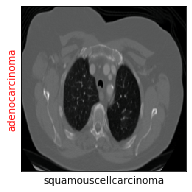

tensor([1])
Evaluating at step 360
Validation Loss: 0.9872, Accuracy: 0.6078


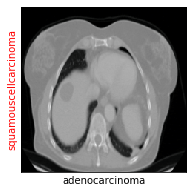

tensor([2])
Evaluating at step 380
Validation Loss: 0.9096, Accuracy: 0.6275


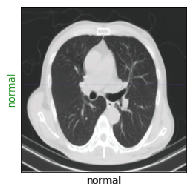

tensor([0])
Evaluating at step 400
Validation Loss: 0.9663, Accuracy: 0.6863


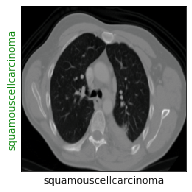

tensor([2])
Evaluating at step 420
Validation Loss: 0.9456, Accuracy: 0.7647


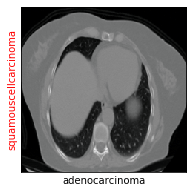

tensor([2])
Evaluating at step 440
Validation Loss: 0.9665, Accuracy: 0.6471


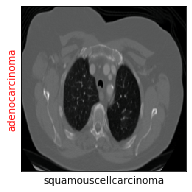

tensor([1])
Evaluating at step 460
Validation Loss: 0.9648, Accuracy: 0.6275


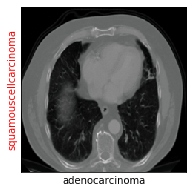

tensor([2])
Evaluating at step 480
Validation Loss: 0.9365, Accuracy: 0.6863


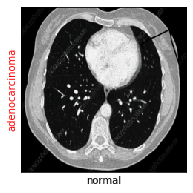

tensor([1])
Accuracy: 0.6862745098039216
Training Loss: 0.3687
Starting epoch 4/50
Evaluating at step 0
Validation Loss: 0.9290, Accuracy: 0.7255


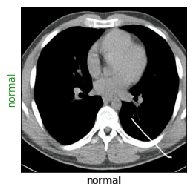

tensor([0])
Evaluating at step 20
Validation Loss: 0.9703, Accuracy: 0.5686


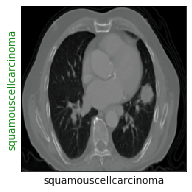

tensor([2])
Evaluating at step 40
Validation Loss: 0.8985, Accuracy: 0.6667


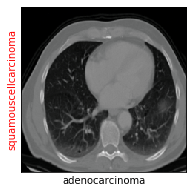

tensor([2])
Evaluating at step 60
Validation Loss: 0.9124, Accuracy: 0.6275


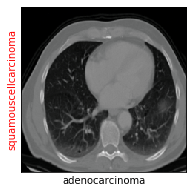

tensor([2])
Evaluating at step 80
Validation Loss: 0.8962, Accuracy: 0.6667


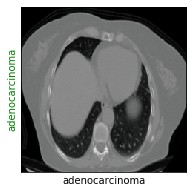

tensor([1])
Evaluating at step 100
Validation Loss: 0.9550, Accuracy: 0.5490


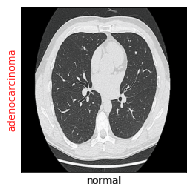

tensor([1])
Evaluating at step 120
Validation Loss: 0.9993, Accuracy: 0.5098


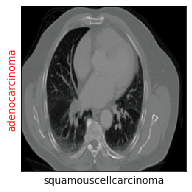

tensor([1])
Evaluating at step 140
Validation Loss: 0.9272, Accuracy: 0.6863


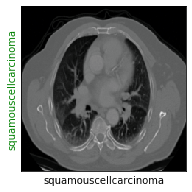

tensor([2])
Evaluating at step 160
Validation Loss: 0.9281, Accuracy: 0.7059


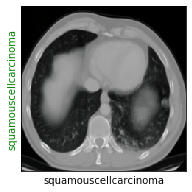

tensor([2])
Evaluating at step 180
Validation Loss: 0.9202, Accuracy: 0.7843


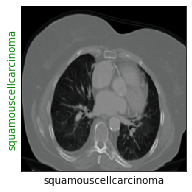

tensor([2])
Evaluating at step 200
Validation Loss: 0.8894, Accuracy: 0.7843


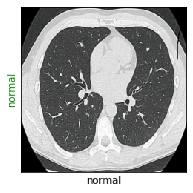

tensor([0])
Evaluating at step 220
Validation Loss: 0.8887, Accuracy: 0.6863


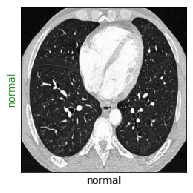

tensor([0])
Evaluating at step 240
Validation Loss: 0.9200, Accuracy: 0.6667


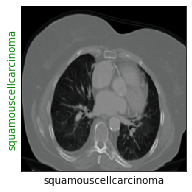

tensor([2])
Evaluating at step 260
Validation Loss: 0.9247, Accuracy: 0.7647


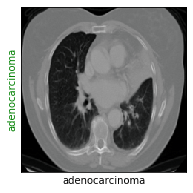

tensor([1])
Evaluating at step 280
Validation Loss: 0.9515, Accuracy: 0.5882


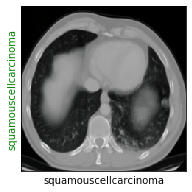

tensor([2])
Evaluating at step 300
Validation Loss: 0.9960, Accuracy: 0.4706


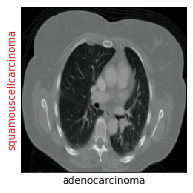

tensor([2])
Evaluating at step 320
Validation Loss: 0.9930, Accuracy: 0.4902


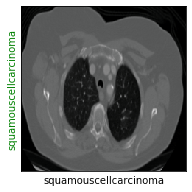

tensor([2])
Evaluating at step 340
Validation Loss: 1.0220, Accuracy: 0.3529


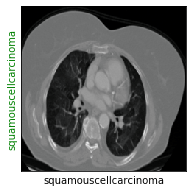

tensor([2])
Evaluating at step 360
Validation Loss: 0.8544, Accuracy: 0.7647


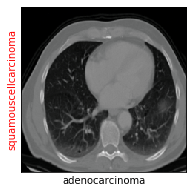

tensor([2])
Evaluating at step 380
Validation Loss: 1.0157, Accuracy: 0.6667


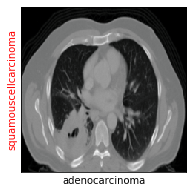

tensor([2])
Evaluating at step 400
Validation Loss: 0.9371, Accuracy: 0.4902


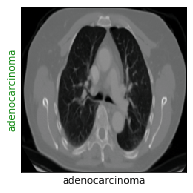

tensor([1])
Evaluating at step 420
Validation Loss: 0.9397, Accuracy: 0.5882


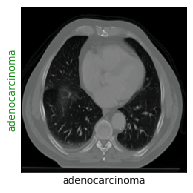

tensor([1])
Evaluating at step 440
Validation Loss: 0.8589, Accuracy: 0.7843


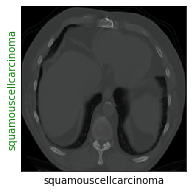

tensor([2])
Evaluating at step 460
Validation Loss: 0.9110, Accuracy: 0.5882


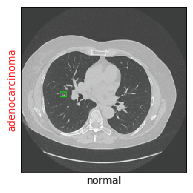

tensor([1])
Evaluating at step 480
Validation Loss: 0.9454, Accuracy: 0.5098


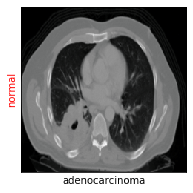

tensor([0])
Accuracy: 0.5098039215686274
Training Loss: 0.2239
Starting epoch 5/50
Evaluating at step 0
Validation Loss: 0.9186, Accuracy: 0.7059


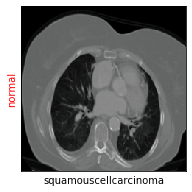

tensor([0])
Evaluating at step 20
Validation Loss: 0.9087, Accuracy: 0.6863


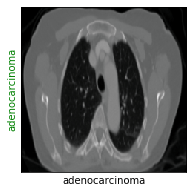

tensor([1])
Evaluating at step 40
Validation Loss: 0.9295, Accuracy: 0.5490


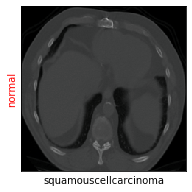

tensor([0])
Evaluating at step 60
Validation Loss: 1.0708, Accuracy: 0.4706


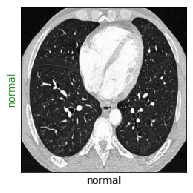

tensor([0])
Evaluating at step 80
Validation Loss: 0.9139, Accuracy: 0.7255


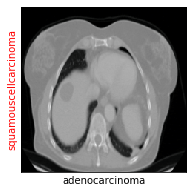

tensor([2])
Evaluating at step 100
Validation Loss: 0.9097, Accuracy: 0.5686


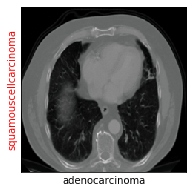

tensor([2])
Evaluating at step 120
Validation Loss: 0.8785, Accuracy: 0.7255


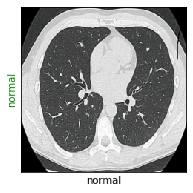

tensor([0])
Evaluating at step 140
Validation Loss: 0.8732, Accuracy: 0.6078


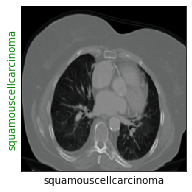

tensor([2])
Evaluating at step 160
Validation Loss: 0.8981, Accuracy: 0.5882


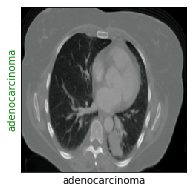

tensor([1])
Evaluating at step 180
Validation Loss: 0.9415, Accuracy: 0.4510


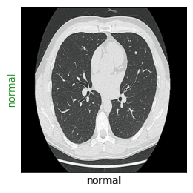

tensor([0])
Evaluating at step 200
Validation Loss: 0.8700, Accuracy: 0.7255


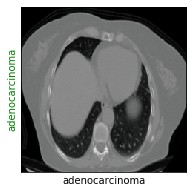

tensor([1])
Evaluating at step 220
Validation Loss: 0.9711, Accuracy: 0.4902


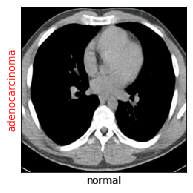

tensor([1])
Evaluating at step 240
Validation Loss: 0.9067, Accuracy: 0.6471


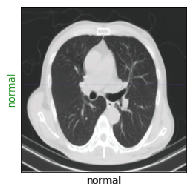

tensor([0])
Evaluating at step 260
Validation Loss: 0.9061, Accuracy: 0.6471


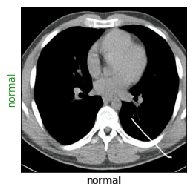

tensor([0])
Evaluating at step 280
Validation Loss: 0.8796, Accuracy: 0.6078


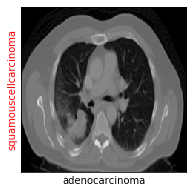

tensor([2])
Evaluating at step 300
Validation Loss: 0.9279, Accuracy: 0.5294


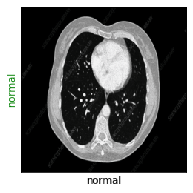

tensor([0])
Evaluating at step 320
Validation Loss: 0.9667, Accuracy: 0.4314


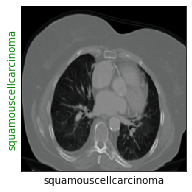

tensor([2])
Evaluating at step 340
Validation Loss: 0.8869, Accuracy: 0.6078


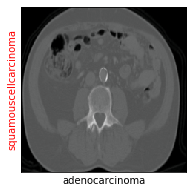

tensor([2])
Evaluating at step 360
Validation Loss: 0.9383, Accuracy: 0.5098


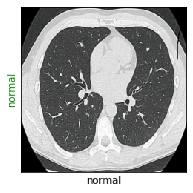

tensor([0])
Evaluating at step 380
Validation Loss: 0.9042, Accuracy: 0.5098


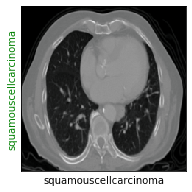

tensor([2])
Evaluating at step 400
Validation Loss: 0.8498, Accuracy: 0.6275


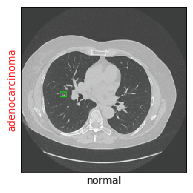

tensor([1])
Evaluating at step 420
Validation Loss: 0.9497, Accuracy: 0.4510


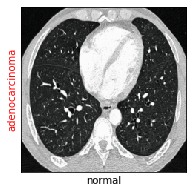

tensor([1])
Evaluating at step 440
Validation Loss: 1.0204, Accuracy: 0.4314


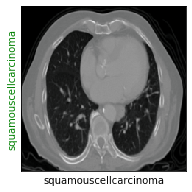

tensor([2])
Evaluating at step 460
Validation Loss: 1.0005, Accuracy: 0.3333


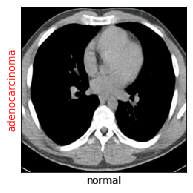

tensor([1])
Evaluating at step 480
Validation Loss: 0.9563, Accuracy: 0.5686


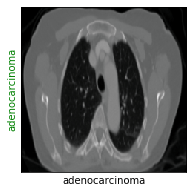

tensor([1])
Accuracy: 0.5686274509803921
Training Loss: 0.1258
Starting epoch 6/50
Evaluating at step 0
Validation Loss: 0.9218, Accuracy: 0.5882


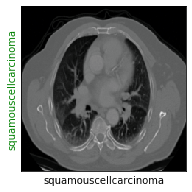

tensor([2])
Evaluating at step 20
Validation Loss: 0.9591, Accuracy: 0.4706


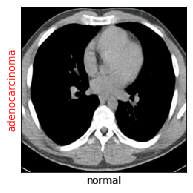

tensor([1])
Evaluating at step 40
Validation Loss: 0.9053, Accuracy: 0.8039


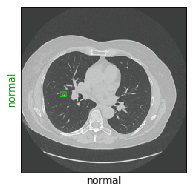

tensor([0])
Evaluating at step 60
Validation Loss: 0.8929, Accuracy: 0.6667


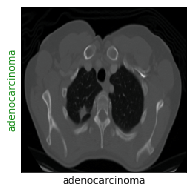

tensor([1])
Evaluating at step 80
Validation Loss: 0.8031, Accuracy: 0.8039


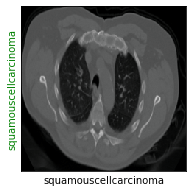

tensor([2])
Evaluating at step 100
Validation Loss: 0.8446, Accuracy: 0.7451


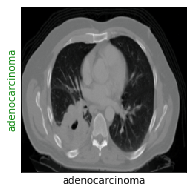

tensor([1])
Evaluating at step 120
Validation Loss: 0.8757, Accuracy: 0.5686


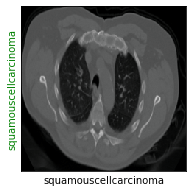

tensor([2])
Evaluating at step 140
Validation Loss: 0.9091, Accuracy: 0.6275


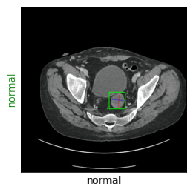

tensor([0])
Evaluating at step 160
Validation Loss: 0.9221, Accuracy: 0.5882


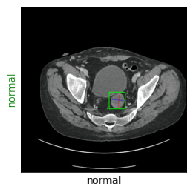

tensor([0])
Evaluating at step 180
Validation Loss: 0.8213, Accuracy: 0.7059


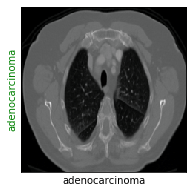

tensor([1])
Evaluating at step 200
Validation Loss: 0.9097, Accuracy: 0.4902


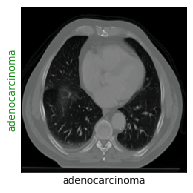

tensor([1])
Evaluating at step 220
Validation Loss: 0.8093, Accuracy: 0.6078


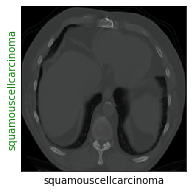

tensor([2])
Evaluating at step 240
Validation Loss: 0.7789, Accuracy: 0.6078


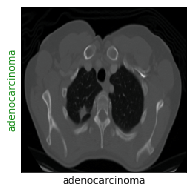

tensor([1])
Evaluating at step 260
Validation Loss: 0.8597, Accuracy: 0.6275


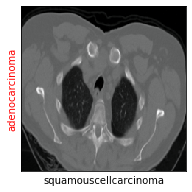

tensor([1])
Evaluating at step 280
Validation Loss: 0.9414, Accuracy: 0.6863


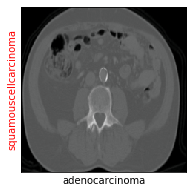

tensor([2])
Evaluating at step 300
Validation Loss: 0.9411, Accuracy: 0.5098


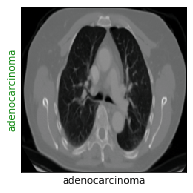

tensor([1])
Evaluating at step 320
Validation Loss: 0.9202, Accuracy: 0.5686


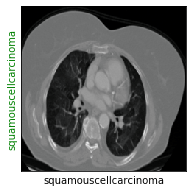

tensor([2])
Evaluating at step 340
Validation Loss: 0.8610, Accuracy: 0.6667


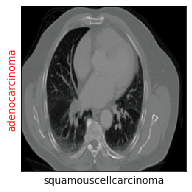

tensor([1])
Evaluating at step 360
Validation Loss: 0.8478, Accuracy: 0.7255


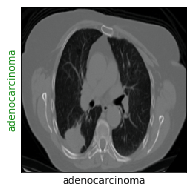

tensor([1])
Evaluating at step 380
Validation Loss: 0.8508, Accuracy: 0.8039


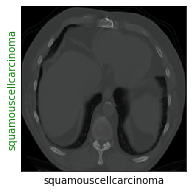

tensor([2])
Evaluating at step 400
Validation Loss: 0.8652, Accuracy: 0.6471


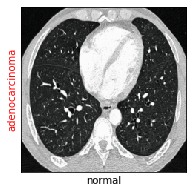

tensor([1])
Evaluating at step 420
Validation Loss: 0.8794, Accuracy: 0.6078


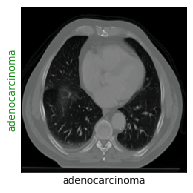

tensor([1])
Evaluating at step 440
Validation Loss: 0.9185, Accuracy: 0.5098


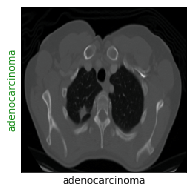

tensor([1])
Evaluating at step 460
Validation Loss: 0.9072, Accuracy: 0.6471


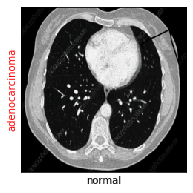

tensor([1])
Evaluating at step 480
Validation Loss: 0.8577, Accuracy: 0.5686


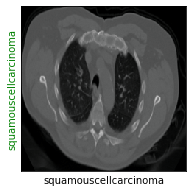

tensor([2])
Accuracy: 0.5686274509803921
Training Loss: 0.0678
Starting epoch 7/50
Evaluating at step 0
Validation Loss: 0.9541, Accuracy: 0.5686


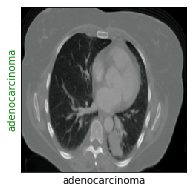

tensor([1])
Evaluating at step 20
Validation Loss: 0.8941, Accuracy: 0.5294


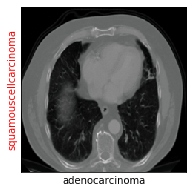

tensor([2])
Evaluating at step 40
Validation Loss: 0.9573, Accuracy: 0.5686


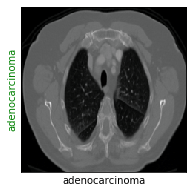

tensor([1])
Evaluating at step 60
Validation Loss: 0.8664, Accuracy: 0.7451


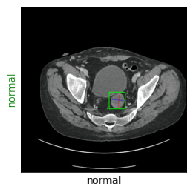

tensor([0])
Evaluating at step 80
Validation Loss: 0.8113, Accuracy: 0.7059


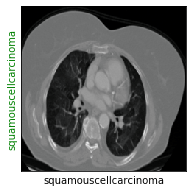

tensor([2])
Evaluating at step 100
Validation Loss: 0.8679, Accuracy: 0.7451


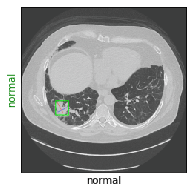

tensor([0])
Evaluating at step 120
Validation Loss: 0.8080, Accuracy: 0.7843


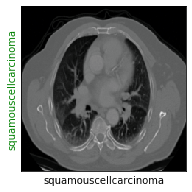

tensor([2])
Evaluating at step 140
Validation Loss: 0.8185, Accuracy: 0.7059


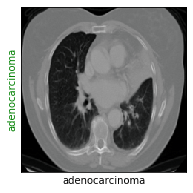

tensor([1])
Evaluating at step 160
Validation Loss: 0.8710, Accuracy: 0.7451


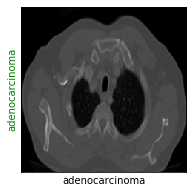

tensor([1])
Evaluating at step 180
Validation Loss: 0.8675, Accuracy: 0.5686


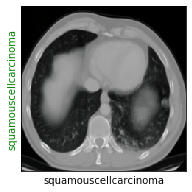

tensor([2])
Evaluating at step 200
Validation Loss: 0.8529, Accuracy: 0.6667


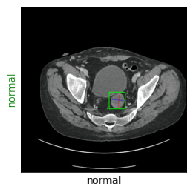

tensor([0])
Evaluating at step 220
Validation Loss: 0.8389, Accuracy: 0.8039


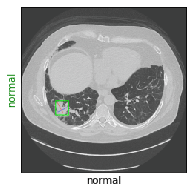

tensor([0])
Evaluating at step 240
Validation Loss: 0.8979, Accuracy: 0.5098


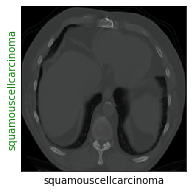

tensor([2])
Evaluating at step 260
Validation Loss: 0.9320, Accuracy: 0.4902


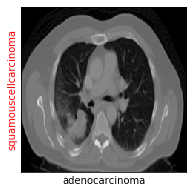

tensor([2])
Evaluating at step 280
Validation Loss: 0.9286, Accuracy: 0.6471


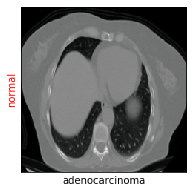

tensor([0])
Evaluating at step 300
Validation Loss: 0.8374, Accuracy: 0.7451


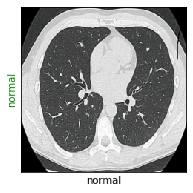

tensor([0])
Evaluating at step 320
Validation Loss: 0.8862, Accuracy: 0.6471


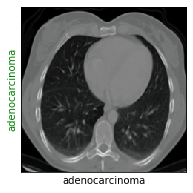

tensor([1])
Evaluating at step 340
Validation Loss: 0.8394, Accuracy: 0.7647


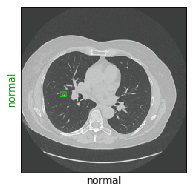

tensor([0])
Evaluating at step 360
Validation Loss: 0.8094, Accuracy: 0.8431


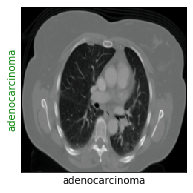

tensor([1])
Evaluating at step 380
Validation Loss: 0.8534, Accuracy: 0.7647


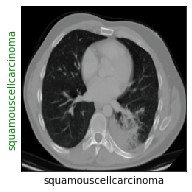

tensor([2])
Evaluating at step 400
Validation Loss: 0.9017, Accuracy: 0.5294


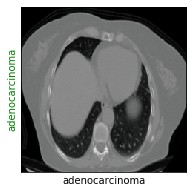

tensor([1])
Evaluating at step 420
Validation Loss: 0.8239, Accuracy: 0.8431


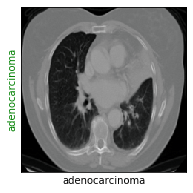

tensor([1])
Evaluating at step 440
Validation Loss: 0.8408, Accuracy: 0.7843


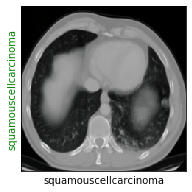

tensor([2])
Evaluating at step 460
Validation Loss: 0.8534, Accuracy: 0.6667


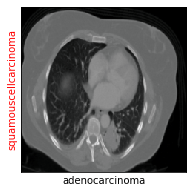

tensor([2])
Evaluating at step 480
Validation Loss: 0.9648, Accuracy: 0.5686


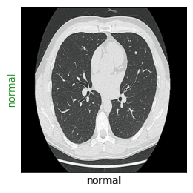

tensor([0])
Accuracy: 0.5686274509803921
Training Loss: 0.0501
Starting epoch 8/50
Evaluating at step 0
Validation Loss: 0.8781, Accuracy: 0.6471


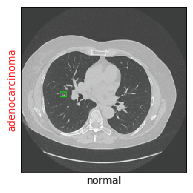

tensor([1])
Evaluating at step 20
Validation Loss: 0.8711, Accuracy: 0.6471


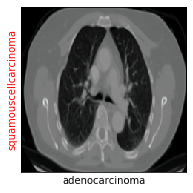

tensor([2])
Evaluating at step 40
Validation Loss: 0.7816, Accuracy: 0.8431


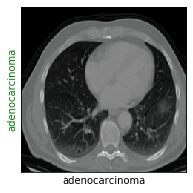

tensor([1])
Evaluating at step 60
Validation Loss: 0.8871, Accuracy: 0.5686


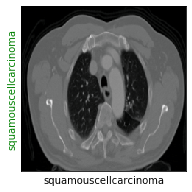

tensor([2])
Evaluating at step 80
Validation Loss: 0.8443, Accuracy: 0.7255


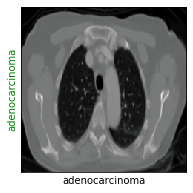

tensor([1])
Evaluating at step 100
Validation Loss: 0.9013, Accuracy: 0.4118


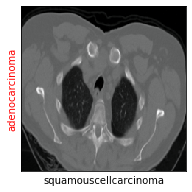

tensor([1])
Evaluating at step 120
Validation Loss: 0.8526, Accuracy: 0.6863


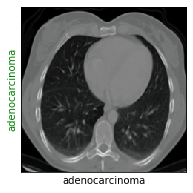

tensor([1])
Evaluating at step 140
Validation Loss: 0.8944, Accuracy: 0.7647


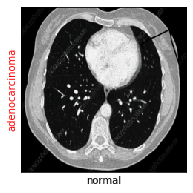

tensor([1])
Evaluating at step 160
Validation Loss: 0.8272, Accuracy: 0.7647


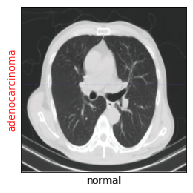

tensor([1])
Evaluating at step 180
Validation Loss: 1.1626, Accuracy: 0.1961


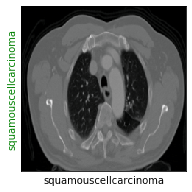

tensor([2])
Evaluating at step 200
Validation Loss: 0.8655, Accuracy: 0.5490


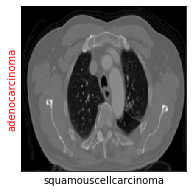

tensor([1])
Evaluating at step 220
Validation Loss: 0.9131, Accuracy: 0.6863


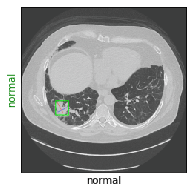

tensor([0])
Evaluating at step 240
Validation Loss: 0.8783, Accuracy: 0.4902


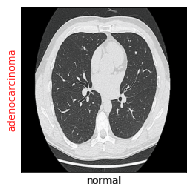

tensor([1])
Evaluating at step 260
Validation Loss: 0.9330, Accuracy: 0.6471


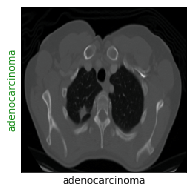

tensor([1])
Evaluating at step 280
Validation Loss: 0.9175, Accuracy: 0.6471


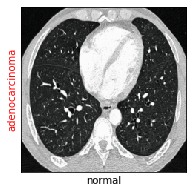

tensor([1])
Evaluating at step 300
Validation Loss: 0.7661, Accuracy: 0.7843


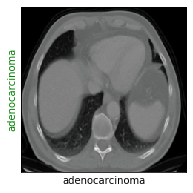

tensor([1])
Evaluating at step 320
Validation Loss: 0.8851, Accuracy: 0.5882


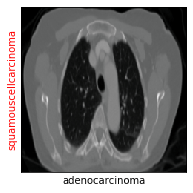

tensor([2])
Evaluating at step 340
Validation Loss: 0.8464, Accuracy: 0.7451


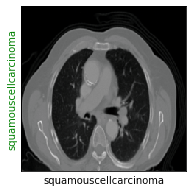

tensor([2])
Evaluating at step 360
Validation Loss: 0.9159, Accuracy: 0.5098


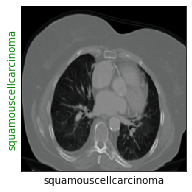

tensor([2])
Evaluating at step 380
Validation Loss: 0.8464, Accuracy: 0.7255


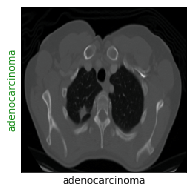

tensor([1])
Evaluating at step 400
Validation Loss: 0.7904, Accuracy: 0.8431


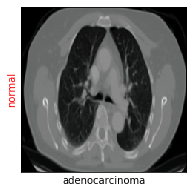

tensor([0])
Evaluating at step 420
Validation Loss: 0.9762, Accuracy: 0.3529


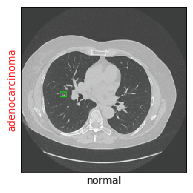

tensor([1])
Evaluating at step 440
Validation Loss: 0.9154, Accuracy: 0.5294


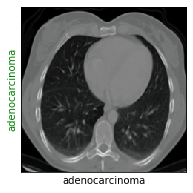

tensor([1])
Evaluating at step 460
Validation Loss: 0.9146, Accuracy: 0.5098


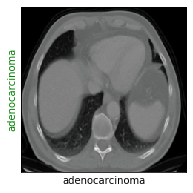

tensor([1])
Evaluating at step 480
Validation Loss: 0.8750, Accuracy: 0.7451


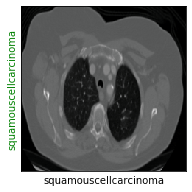

tensor([2])
Accuracy: 0.7450980392156863
Training Loss: 0.0637
Starting epoch 9/50
Evaluating at step 0
Validation Loss: 0.8575, Accuracy: 0.6275


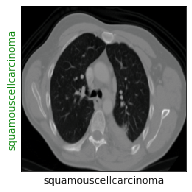

tensor([2])
Evaluating at step 20
Validation Loss: 0.8766, Accuracy: 0.6863


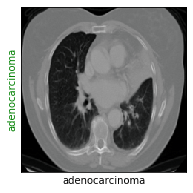

tensor([1])
Evaluating at step 40
Validation Loss: 0.7808, Accuracy: 0.9020


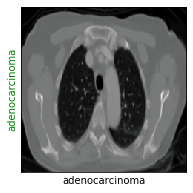

tensor([1])
Evaluating at step 60
Validation Loss: 0.8348, Accuracy: 0.7451


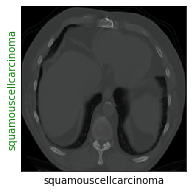

tensor([2])
Evaluating at step 80
Validation Loss: 0.8151, Accuracy: 0.8235


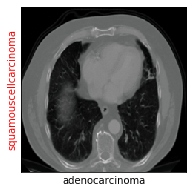

tensor([2])
Evaluating at step 100
Validation Loss: 0.7869, Accuracy: 0.7059


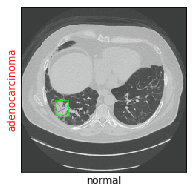

tensor([1])
Evaluating at step 120
Validation Loss: 0.7706, Accuracy: 0.8235


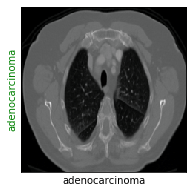

tensor([1])
Evaluating at step 140
Validation Loss: 0.8088, Accuracy: 0.7255


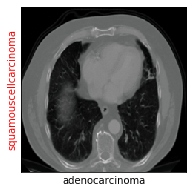

tensor([2])
Evaluating at step 160
Validation Loss: 0.7968, Accuracy: 0.9608


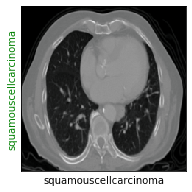

tensor([2])
Performance condition satisfied, stopping..
CPU times: user 1h 29min 30s, sys: 21min 49s, total: 1h 51min 20s
Wall time: 44min 43s


In [101]:
%%time

train(epochs=50)
# torch.save(model.state_dict(), './output/resnet18-model.pt')


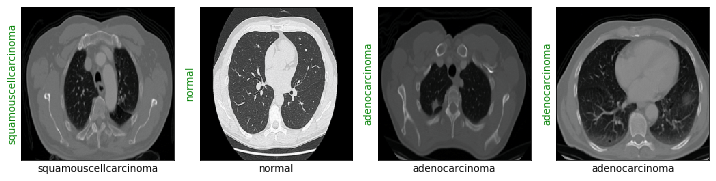

tensor([2, 0, 1, 1])


In [26]:
show_preds()

In [ ]:
check_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [ ]:
check_path ='/check'

check_dataset = ChestXRayDataset(test_dirs, test_transform)